<a href="https://colab.research.google.com/github/neel-p8/Exploration-of-tSNE-and-Cifar100/blob/main/Neel_Patel_2_Fall23.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploration-of-tSNE-and-Cifar100



# Imports

In [ ]:
from keras.datasets import cifar100
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.cluster import MiniBatchKMeans

## Load the data

In [ ]:
# use cifar100
(train_images, train_labels), (test_images, test_labels) = cifar100.load_data()
train_images = train_images / 255.

169001437/169001437 [==============================] - 3s 0us/step


In [ ]:
# ...
print(train_images.shape)
print(train_labels.shape)
print(test_images.shape)
print(test_labels.shape)

(50000, 32, 32, 3)
(50000, 1)
(10000, 32, 32, 3)
(10000, 1)


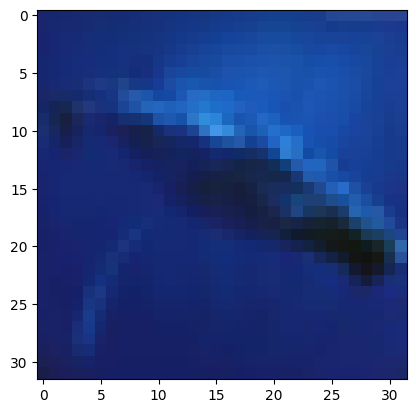

In [ ]:
ind = 4311
plt.imshow(train_images[ind])
plt.show()

## Channels of an RGB image
Plot each channel separately using plt.imshow

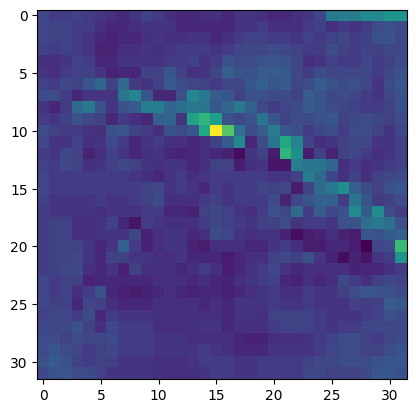

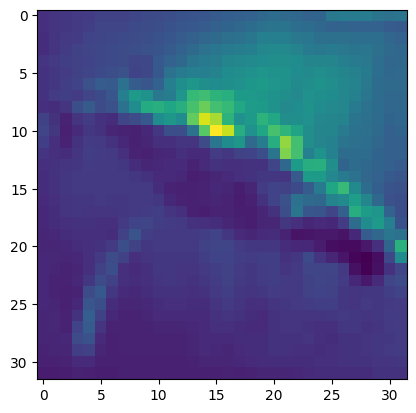

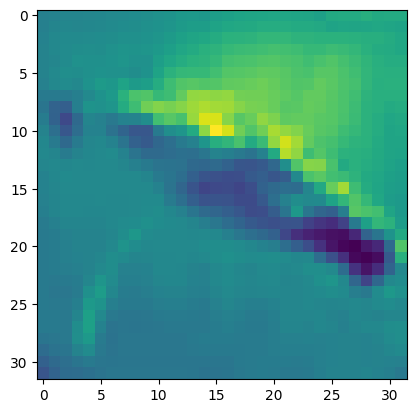

In [ ]:
#used to compare rgb channels if visual not enough
for i in range(3): # it's okay to use loops when it makes sense
  plt.imshow(train_images[ind][:, :, i])
  plt.show() # remember to force each image to be plotted

# Closest images

Function gives $k$ nearest vectors (in the sense of the Euclidean distance).  

In [ ]:
def plot_images_in_a_row(ims):
  'Takes a list/array of images and plots them spaced horizontally.'
  _, axs = plt.subplots(1, len(ims), figsize = (20,5))
  for im, ax in zip(ims, axs.ravel()):
    ax.imshow(im)
    ax.axis('off')

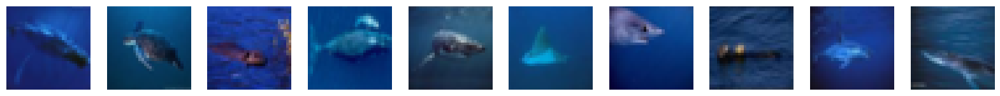

In [ ]:
# your code

#convert image and vectors to np array for easy testing
def nvec(image, vectors, k):
  image = np.array(image)
  vectors = np.array(vectors)
  distance = np.linalg.norm(vectors - image, axis = 1)
  index = np.argsort(distance)[:k]
  return vectors[index]

# test function
assert np.array_equal(nvec([1,1], [[2,2], [2,1], [1,2]], 1), [[2,1]])
assert np.array_equal(nvec([5,3], [[2,2], [2,1], [1,2]], 1), [[2,2]])
assert np.array_equal(nvec([3, 3], [[2, 2], [2, 1], [1, 2], [3,3]], 2), [[3, 3], [2,2]])
assert np.array_equal(nvec([1,1,1], [[2,2,2], [2,1,1], [1,2,3], [1,0,1]], 1), [[2,1,1]])

#plot closest images
closest_images = nvec(train_images[ind].reshape(-1), train_images.reshape(len(train_images), -1), 10)
plot_images_in_a_row(closest_images.reshape(-1, 32, 32, 3))

# Exploring the data with t-SNE


In [ ]:
# ...
# reduce dimensions to 2
num_iters = 650 # PARAM <- controls speed vs accuracy
perplexity = 23 # PARAM
my_random_state = 1236 # PARAM
NUM_VECTORS = 2500

## Init TSNE
tsne = TSNE(n_components = 2, n_iter = num_iters, perplexity = perplexity, random_state = my_random_state)

Fit model with data and retreive the result

In [ ]:
tsne_data = tsne.fit_transform(train_images[:NUM_VECTORS].reshape(NUM_VECTORS, -1))

## Plotting t-SNE embedding



Scatter-plot the output of tSNE

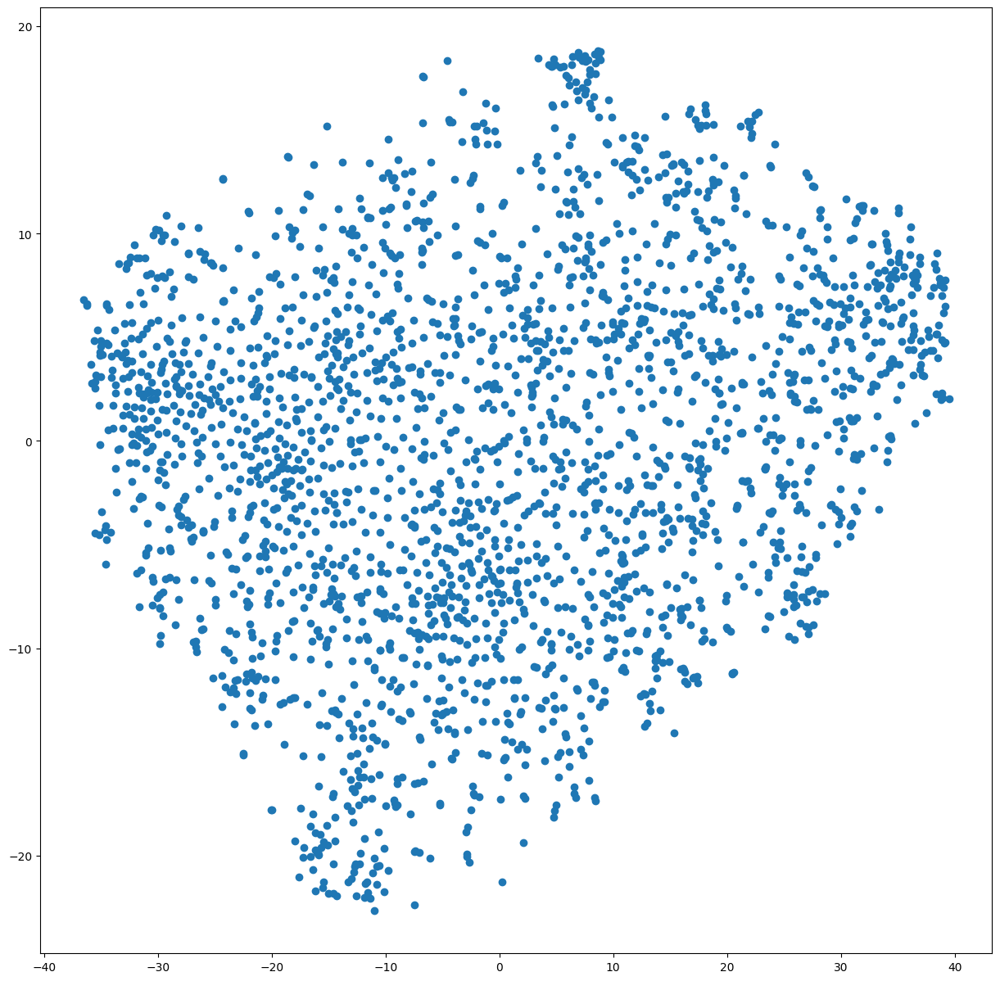

In [ ]:
# ...
plt.figure(figsize = (15,15))
plt.scatter(tsne_data[:, 0], tsne_data[:, 1])
plt.show()

Scatter-plot output but assigning a color Images with the same label get the same color.

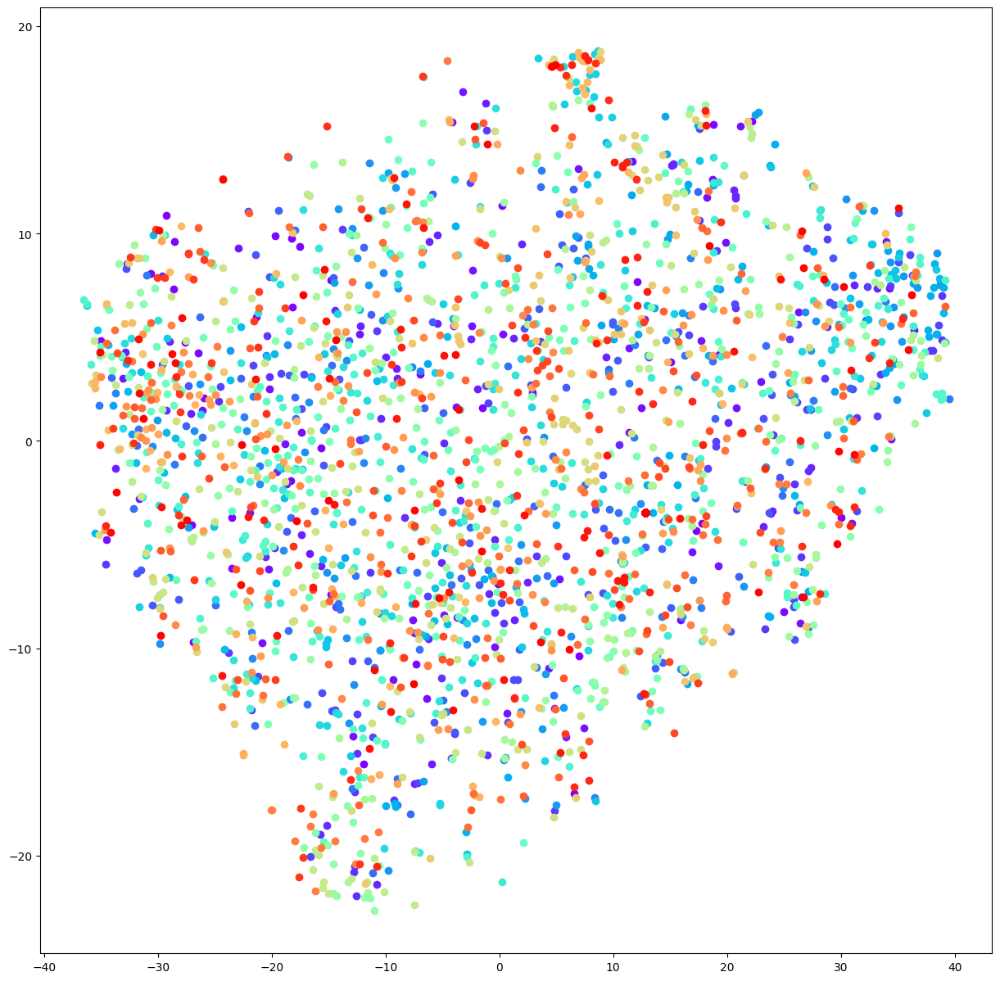

In [ ]:
# ...

# Create a color map
colors = plt.cm.rainbow(np.linspace(0, 1, len(set(np.squeeze(train_labels[:NUM_VECTORS])))))
plt.figure(figsize = (15,15))

# Create a scatter plot of the t-SNE output
for i, color in zip(range(len(set(np.squeeze(train_labels[:NUM_VECTORS])))), colors):
    index = np.where(train_labels[:NUM_VECTORS] == i)
    plt.scatter(tsne_data[index, 0], tsne_data[index, 1], c=color[np.newaxis, :])

plt.show()


## Plotting the images in t-SNE embedding space

Plot the tsne output again but plot the original images at locations given by tsne  

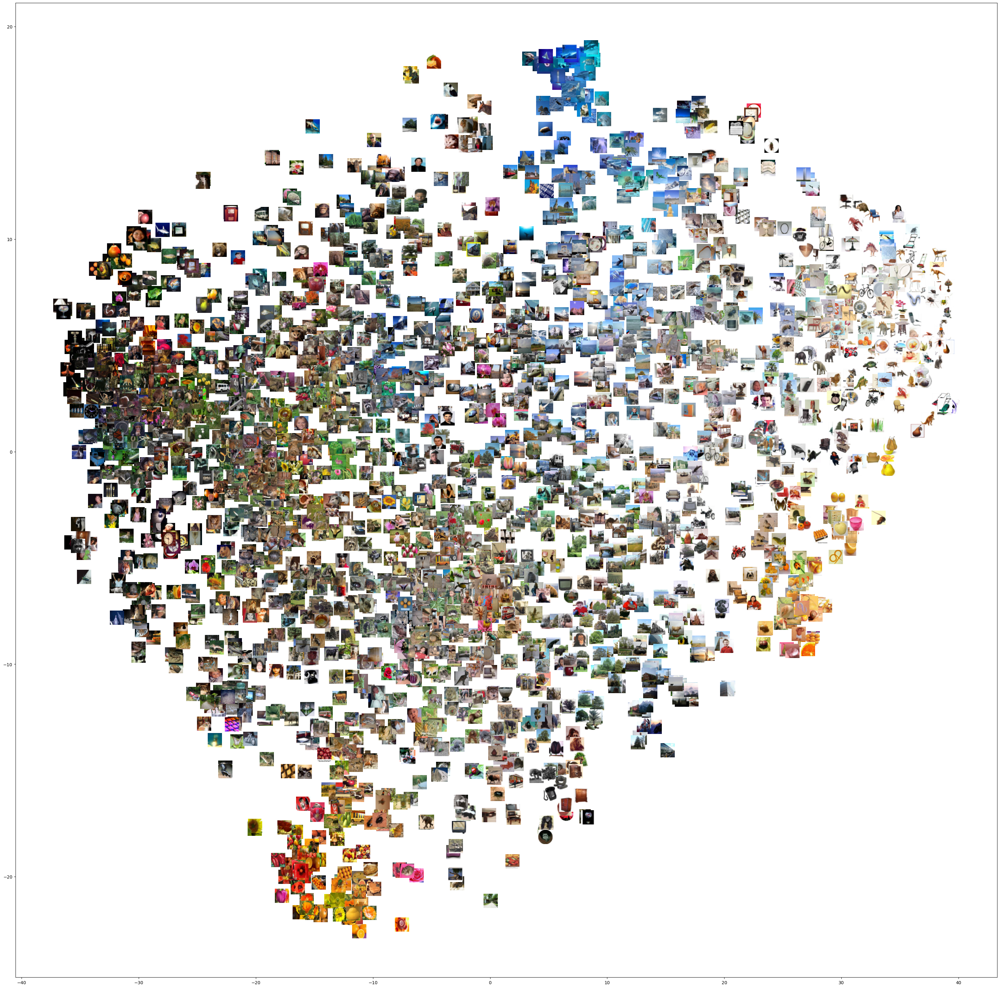

In [ ]:
# ...
def plot_image_at_point(im, xy, zoom = 1):
  '''
  Plots a tiny image at point xy.
  '''
  dxy = np.random.rand(2)/100 * plt.ylim()
  plt.arrow(*xy, *dxy)
  ab = AnnotationBbox(OffsetImage(im, zoom=zoom, cmap = 'gray_r'), xy + dxy, frameon=False)
  plt.gca().add_artist(ab)

np.random.seed(0)
plt.figure(figsize = (40,40)) # larger figure may be better
image_zoom = 1.0 # controls the size of plotted inmages

plt.scatter(*tsne_data.T)
for im, xy in zip(train_images, tsne_data):
  plot_image_at_point(im, xy, image_zoom)

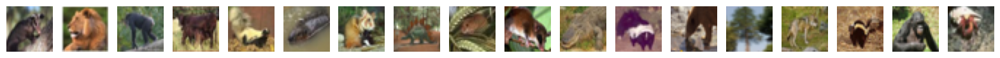

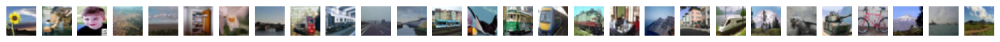

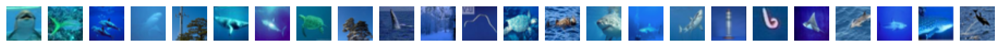

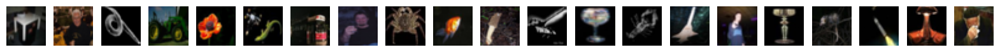

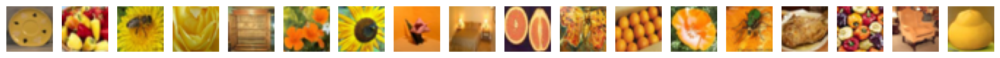

In [ ]:
# ...
coord_1 = (-15, -5)
coord_2 = (4, 5)
coord_3 = (6, 17)
coord_4 = (-35, 5)
coord_5 = (-11, -20)

#plot images close to selected coordinate
def plot_close_images(coord):
  # Calculate the Euclidean distances between each t-SNE coordinate and the target coordinate
  distance = np.sqrt(np.sum((tsne_data[:] - np.array(coord))**2, axis=1))

  # Set a distance threshold to select nearby coordinates
  distance_sd = 2.0
  train_images_plot = train_images[:NUM_VECTORS]

  # Select images that have t-SNE coordinates within the distance threshold
  images = [train_images_plot[i] for i in range(len(train_images_plot)) if distance[i] <= distance_sd]

  # Plot the selected images in a horizontal row
  return plot_images_in_a_row(images)

plot_close_images(coord_1)
plot_close_images(coord_2)
plot_close_images(coord_3)
plot_close_images(coord_4)
plot_close_images(coord_5)

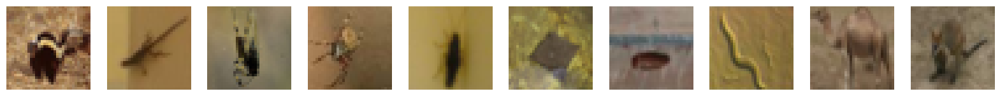

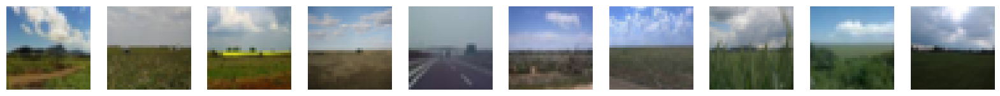

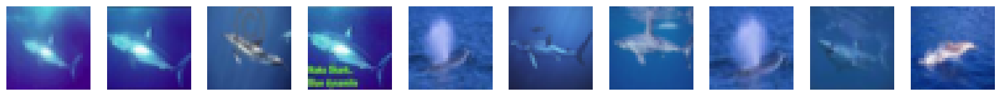

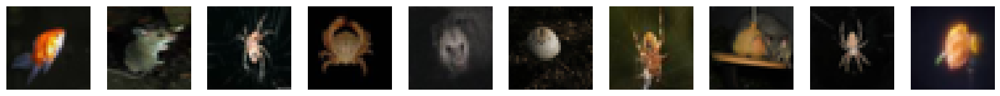

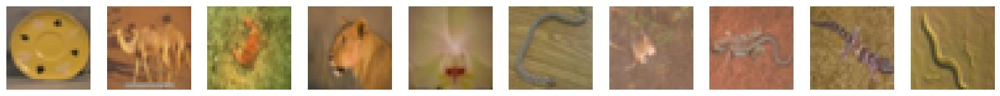

In [ ]:
# ...

#change nvec to return index rather than vector
def modified_nvec(image, vectors, k):
  image = np.array(image).flatten()
  vectors = np.array([i.flatten() for i in vectors])
  distance = np.linalg.norm(vectors - image, axis = 1)
  index = np.argsort(distance)[:k]
  return index

# modify above function for high dimensions
def plot_close_images_modified(coord, k = 10):
  train_images_plot = train_images

  # finds index closest to tSNE coordinate
  representative_index = modified_nvec(coord, tsne_data, 1)[0]

  # finds image closest to coordinate
  representative_image = train_images_plot[representative_index]

  # choose k because first image is representative image, so nearest 10 including query point
  closest_hd_index = modified_nvec(representative_image, train_images_plot, k)

  # all corresponding images from high dimensions
  closest_hd_image = [train_images_plot[i] for i in closest_hd_index]

  plot_images_in_a_row(closest_hd_image)

plot_close_images_modified(coord_1)
plot_close_images_modified(coord_2)
plot_close_images_modified(coord_3)
plot_close_images_modified(coord_4)
plot_close_images_modified(coord_5)

# Clustering with k-Means

In [ ]:
# ...
k = 10
km = MiniBatchKMeans(n_clusters = k, n_init = 'auto')

Fit kMeans with data.

In [ ]:
# ...
km.fit(train_images[:NUM_VECTORS].reshape(len(train_images[:NUM_VECTORS]), -1))

MiniBatchKMeans(n_clusters=10, n_init='auto')

## Plot tSNE embedding using clusters' labels

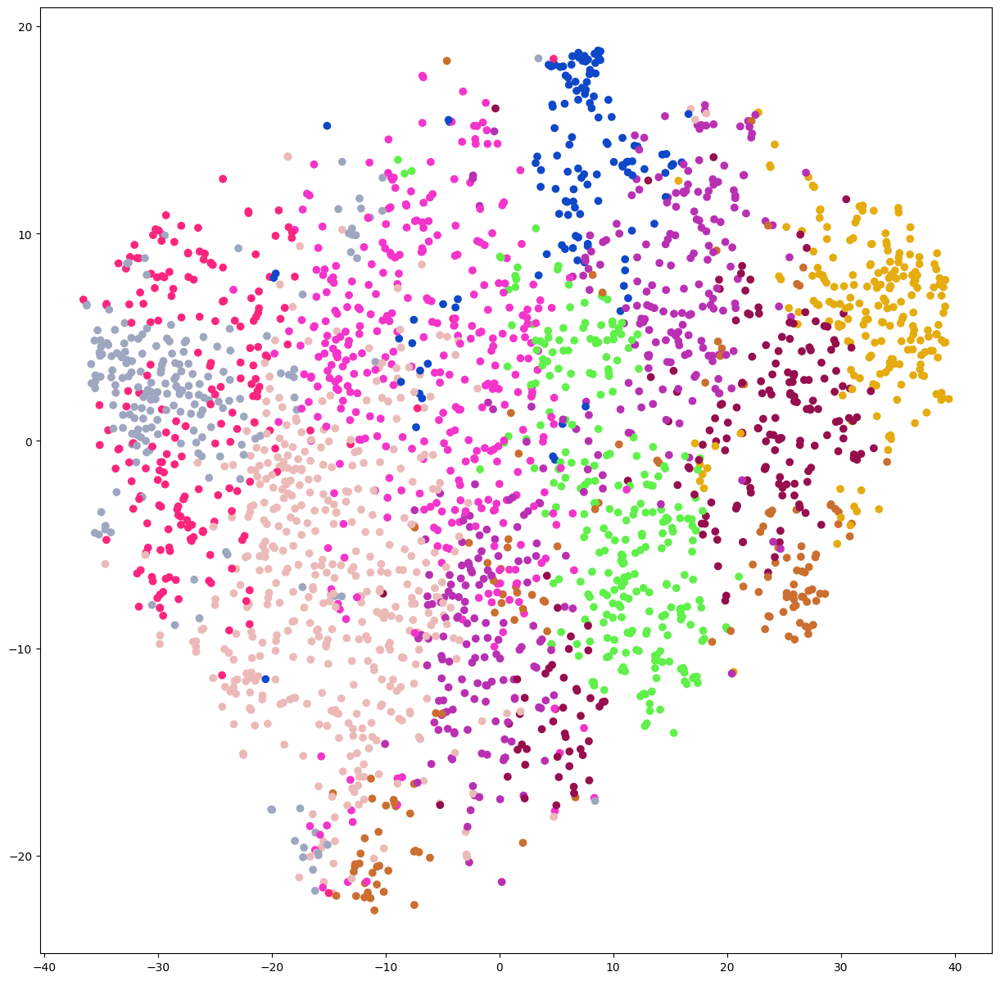

In [ ]:
# ...
plt.figure(figsize = (15,15))
labels = km.labels_

# change labels to avoid 50000 length from subset
labels_tsne = labels[:NUM_VECTORS]

# assign colors
label_colors = np.random.rand(k, 3)

# plot points adjusting for subset
point_colors = label_colors[labels_tsne]
plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c = point_colors)
plt.show()

Repeat plot above but define color of each point as mean color of
the images in the cluster to which image belongs to.

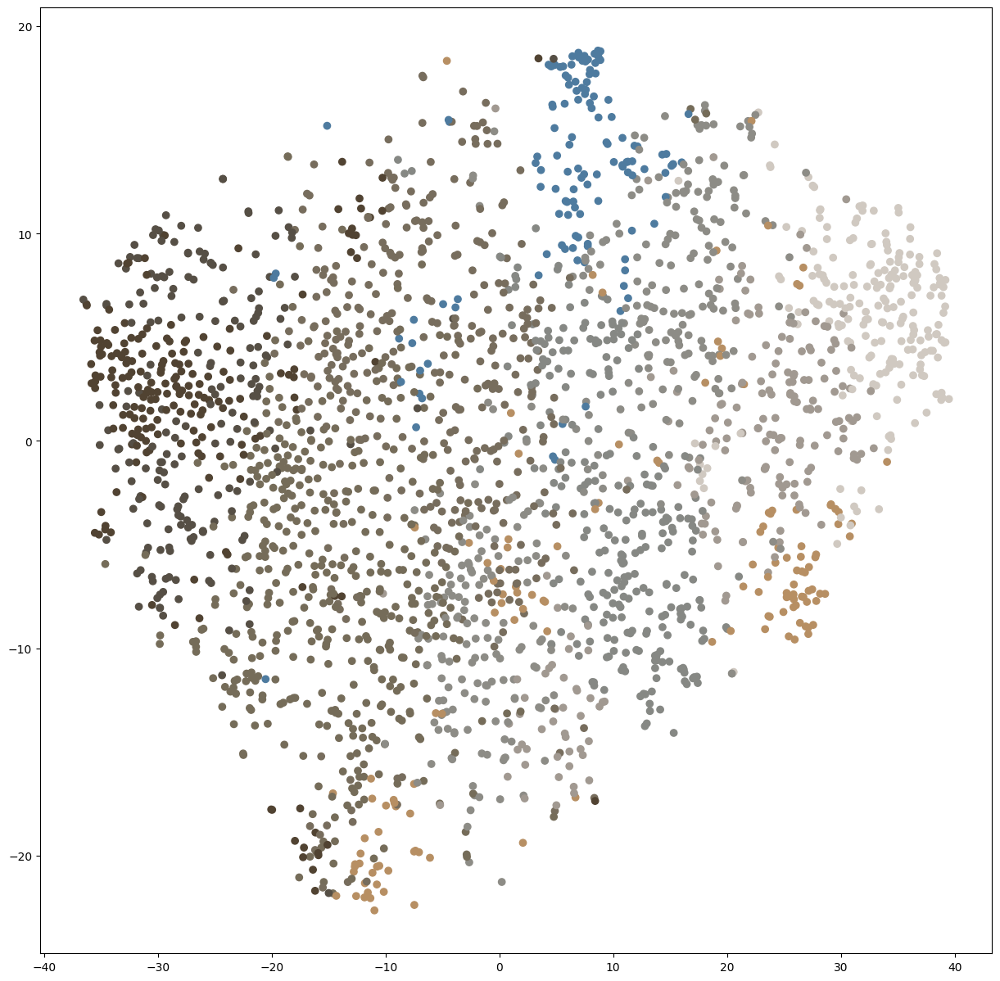

In [ ]:
# ...
# assign mean colors for tsne plot iterations
train_tsne_subset = train_images[:NUM_VECTORS]

# calculate mean color for clusters into array
mean_color = np.array([np.mean(train_tsne_subset[labels_tsne == i], axis = (0, 1, 2)) for i in range(k)])

color_point = mean_color[labels_tsne]

plt.figure(figsize = (15,15))
plt.scatter(tsne_data[:, 0], tsne_data[:, 1], c = color_point)
plt.show()

## kMeans on the entire dataset

In [ ]:
# ...
km_full = MiniBatchKMeans(n_clusters = k, n_init = 'auto')
km_full.fit(train_images.reshape(len(train_images), -1))

MiniBatchKMeans(n_clusters=10, n_init='auto')

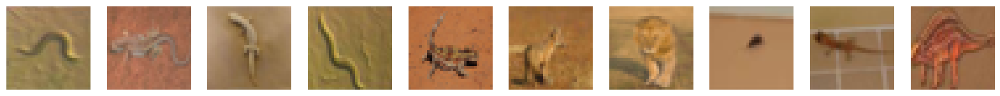

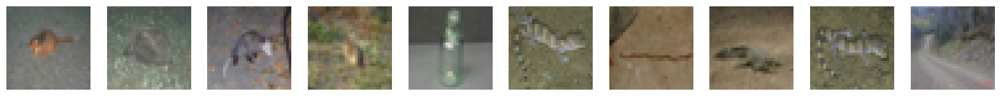

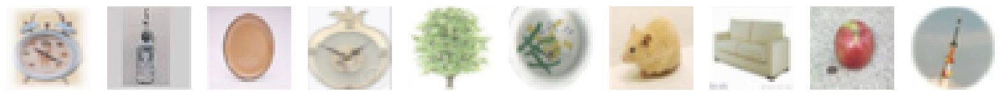

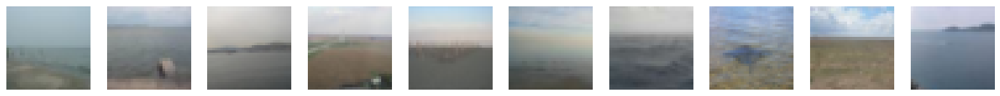

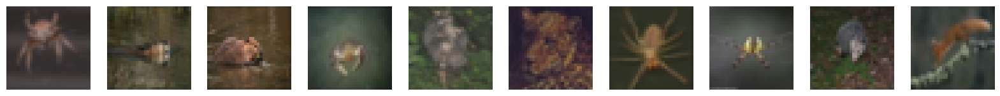

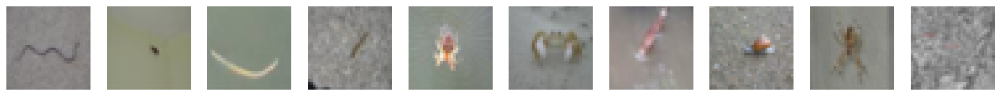

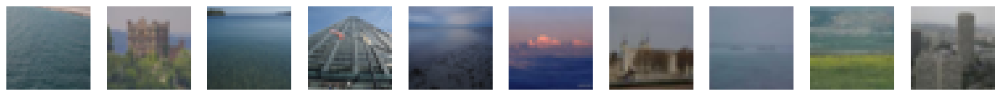

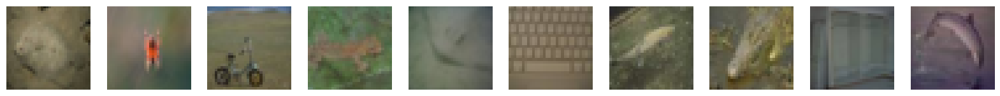

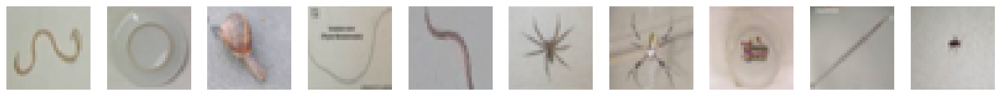

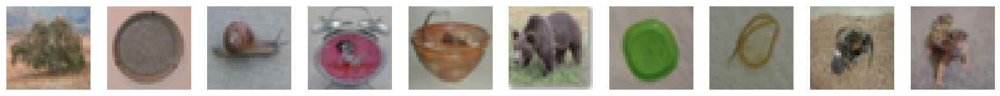

In [ ]:
# ...
cluster_center = km_full.cluster_centers_
closest_for_plot = []
image_reshape = train_images.reshape(len(train_images), -1)

for i in range(k):
  distance = np.linalg.norm(image_reshape - cluster_center[i], axis=1)
  index = np.argsort(distance)[:10]
  closest_for_plot.append(train_images[index])

closest_for_plot = np.array(closest_for_plot)

plot_images_in_a_row(closest_for_plot[0].reshape(-1, 32, 32, 3))
plot_images_in_a_row(closest_for_plot[1].reshape(-1, 32, 32, 3))
plot_images_in_a_row(closest_for_plot[2].reshape(-1, 32, 32, 3))
plot_images_in_a_row(closest_for_plot[3].reshape(-1, 32, 32, 3))
plot_images_in_a_row(closest_for_plot[4].reshape(-1, 32, 32, 3))
plot_images_in_a_row(closest_for_plot[5].reshape(-1, 32, 32, 3))
plot_images_in_a_row(closest_for_plot[6].reshape(-1, 32, 32, 3))
plot_images_in_a_row(closest_for_plot[7].reshape(-1, 32, 32, 3))
plot_images_in_a_row(closest_for_plot[8].reshape(-1, 32, 32, 3))
plot_images_in_a_row(closest_for_plot[9].reshape(-1, 32, 32, 3))

# Import User Input

In [ ]:
# Another helper function
from google.colab import files
from PIL import Image

def get_uploaded_image(size = (32,32)):
  '''Lets you download and image.
  Returns an np.array representing the downloaded image.
  The image is resized to the provided size.
  '''
  filename = list(files.upload())[-1]
  im = Image.open(filename).resize(size)
  npim = np.array(im)[..., :3].astype(float)
  if npim.max() > 2:
    npim /= 255.
  return npim

Saving tiger.jpg to tiger (1).jpg


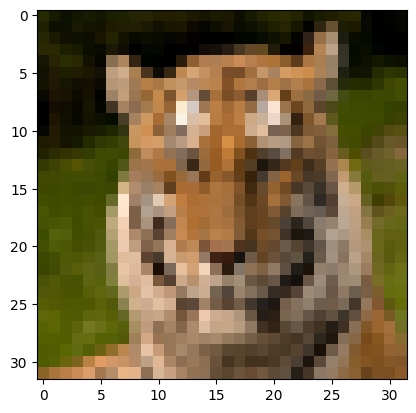

In [ ]:
your_image = get_uploaded_image()
plt.imshow(your_image)

Plot the most similar images to the cluster closest to the image



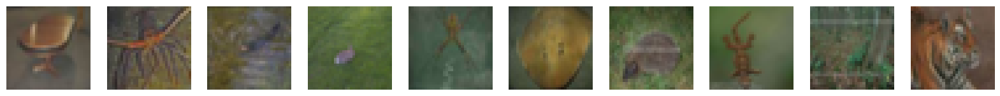

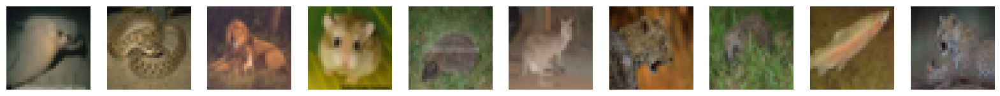

In [ ]:
# ...

# plot images closest to cluster center
image_cluster = km.predict(your_image.reshape(1, -1))

# find cluster center and calculate distance from images
cluster_center = km.cluster_centers_[image_cluster]
distance = np.linalg.norm(image_reshape - cluster_center, axis = 1)

# print 10 images
index = np.argsort(distance)[:10]
plot_images_in_a_row(train_images[index])

# do the same thing except compare image similarity rather than by cluster
distance = np.linalg.norm(image_reshape - your_image.reshape(1, -1), axis = 1)
index = np.argsort(distance)[:10]
plot_images_in_a_row(train_images[index])